# Annotation

<p>The task is to forecast store sales using the last year's sales data, which includes information about stores (their type, location, etc.), goods families, promotions, national and local events or holidays, transmissions and oil prices. 
    
https://www.kaggle.com/competitions/store-sales-time-series-forecasting

In [1]:
import os
os.chdir(os.environ['PROJECT_ROOT'])

In [2]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import sklearn
from pathlib import Path

%matplotlib inline
warnings.simplefilter(action='ignore', category=FutureWarning)

# First look at the data

In [88]:
DATA_ROOT = Path('data', 'kaggle', 'store-sales-time-series-forecasting')

In [89]:
train_data = pd.read_csv(DATA_ROOT / 'train.csv', index_col = 'id')
train_data.head()

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,2013-01-01,1,BABY CARE,0.0,0
2,2013-01-01,1,BEAUTY,0.0,0
3,2013-01-01,1,BEVERAGES,0.0,0
4,2013-01-01,1,BOOKS,0.0,0


In [90]:
stores_data = pd.read_csv(DATA_ROOT / 'stores.csv')
stores_data.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [91]:
oil_data = pd.read_csv(DATA_ROOT / 'oil.csv')
oil_data.tail()

,date,dcoilwtico
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96
1217,2017-08-31,47.26


In [92]:
holidays_events_data = pd.read_csv(DATA_ROOT / 'holidays_events.csv')
holidays_events_data.tail()

,date,type,locale,locale_name,description,transferred
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False
349,2017-12-26,Additional,National,Ecuador,Navidad+1,False


In [93]:
transactions_data = pd.read_csv(DATA_ROOT / 'transactions.csv')
transactions_data.tail()

,date,store_nbr,transactions
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932
83487,2017-08-15,54,802


In [94]:
stores_data = stores_data.rename(columns={'city': 'store_city', 'state': 'store_state', 
                                          'type': 'store_type', 'cluster': 'store_cluster'})
train_data = train_data.merge(stores_data, on='store_nbr', how='left')
train_data.head()

,date,store_nbr,family,sales,onpromotion,store_city,store_state,store_type,store_cluster
0,2013-01-01,1,AUTOMOTIVE,0.0,0,Quito,Pichincha,D,13
1,2013-01-01,1,BABY CARE,0.0,0,Quito,Pichincha,D,13
2,2013-01-01,1,BEAUTY,0.0,0,Quito,Pichincha,D,13
3,2013-01-01,1,BEVERAGES,0.0,0,Quito,Pichincha,D,13
4,2013-01-01,1,BOOKS,0.0,0,Quito,Pichincha,D,13


In [95]:
train_data = train_data.merge(oil_data, on='date', how='left')
train_data.head()

,date,store_nbr,family,sales,onpromotion,store_city,store_state,store_type,store_cluster,dcoilwtico
0,2013-01-01,1,AUTOMOTIVE,0.0,0,Quito,Pichincha,D,13,NaN
1,2013-01-01,1,BABY CARE,0.0,0,Quito,Pichincha,D,13,NaN
2,2013-01-01,1,BEAUTY,0.0,0,Quito,Pichincha,D,13,NaN
3,2013-01-01,1,BEVERAGES,0.0,0,Quito,Pichincha,D,13,NaN
4,2013-01-01,1,BOOKS,0.0,0,Quito,Pichincha,D,13,NaN


In [96]:
holidays_events_data = holidays_events_data.rename(columns={'locale': 'holiday_locale', 'type': 'holiday_type', 
                                                            'locale_name': 'holiday_locale_name',
                                                            'description': 'holiday_description',
                                                            'transferred': 'holiday_transferred'})
train_data = train_data.merge(holidays_events_data, on='date', how='left')
train_data.head()

,date,store_nbr,family,sales,onpromotion,store_city,store_state,store_type,store_cluster,dcoilwtico,holiday_type,holiday_locale,holiday_locale_name,holiday_description,holiday_transferred
0,2013-01-01,1,AUTOMOTIVE,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False
1,2013-01-01,1,BABY CARE,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False
2,2013-01-01,1,BEAUTY,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False
3,2013-01-01,1,BEVERAGES,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False
4,2013-01-01,1,BOOKS,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False


In [97]:
train_data = train_data.merge(transactions_data, on=('date', 'store_nbr'), how='left')
train_data.head()

,date,store_nbr,family,sales,onpromotion,store_city,store_state,store_type,store_cluster,dcoilwtico,holiday_type,holiday_locale,holiday_locale_name,holiday_description,holiday_transferred,transactions
0,2013-01-01,1,AUTOMOTIVE,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
1,2013-01-01,1,BABY CARE,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
2,2013-01-01,1,BEAUTY,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
3,2013-01-01,1,BEVERAGES,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
4,2013-01-01,1,BOOKS,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN


<i>I chose merging on both columns 'date' and 'store_nbr', because 'train_data' and 'transactions_data' had these two common columns.</i>

In [98]:
train_data.shape

(3054348, 16)

In [99]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3054348 entries, 0 to 3054347
Data columns (total 16 columns):
 #   Column               Dtype  
---  ------               -----  
 0   date                 object 
 1   store_nbr            int64  
 2   family               object 
 3   sales                float64
 4   onpromotion          int64  
 5   store_city           object 
 6   store_state          object 
 7   store_type           object 
 8   store_cluster        int64  
 9   dcoilwtico           float64
 10  holiday_type         object 
 11  holiday_locale       object 
 12  holiday_locale_name  object 
 13  holiday_description  object 
 14  holiday_transferred  object 
 15  transactions         float64
dtypes: float64(3), int64(3), object(10)
memory usage: 396.1+ MB


<i> We can see that there are only 6 numerical features, other 10 features are non-numerical.<br>Since there are two columns in the table with similar names, it is necessary to rename them to avoid the confusion while analyzing data.</i>

In [101]:
train_data['family'] = train_data['family'].str.lower()     # for easier reading
train_data = train_data.rename(columns={'type_x': 'store_type', 'type_y': 'event_type'})
train_data.head()

,date,store_nbr,family,sales,onpromotion,store_city,store_state,store_type,store_cluster,dcoilwtico,holiday_type,holiday_locale,holiday_locale_name,holiday_description,holiday_transferred,transactions
0,2013-01-01,1,automotive,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
1,2013-01-01,1,baby care,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
2,2013-01-01,1,beauty,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
3,2013-01-01,1,beverages,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
4,2013-01-01,1,books,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN


In [102]:
numerical_features = train_data.select_dtypes(include='number').columns.tolist()
numerical_features.remove('store_nbr')
numerical_features.remove('store_cluster')
numerical_features

['sales', 'onpromotion', 'dcoilwtico', 'transactions']

In [103]:
categorical_features = train_data.select_dtypes(exclude='number').columns.tolist()
categorical_features.append('store_nbr')
categorical_features.append('store_cluster')
categorical_features.remove('date')
categorical_features

['family',
 'store_city',
 'store_state',
 'store_type',
 'holiday_type',
 'holiday_locale',
 'holiday_locale_name',
 'holiday_description',
 'holiday_transferred',
 'store_nbr',
 'store_cluster']

In [104]:
train_data['family'].value_counts()

automotive                    92556
home appliances               92556
school and office supplies    92556
produce                       92556
prepared foods                92556
poultry                       92556
players and electronics       92556
pet supplies                  92556
personal care                 92556
meats                         92556
magazines                     92556
liquor,wine,beer              92556
lingerie                      92556
lawn and garden               92556
ladieswear                    92556
home care                     92556
home and kitchen ii           92556
baby care                     92556
home and kitchen i            92556
hardware                      92556
grocery ii                    92556
grocery i                     92556
frozen foods                  92556
eggs                          92556
deli                          92556
dairy                         92556
cleaning                      92556
celebration                 

<i>As we can see, each family has a big number of observations, that is why it may have sense to build separate models for different categories</i>

In [105]:
train_data.isna().mean()

date                   0.000000
store_nbr              0.000000
family                 0.000000
sales                  0.000000
onpromotion            0.000000
store_city             0.000000
store_state            0.000000
store_type             0.000000
store_cluster          0.000000
dcoilwtico             0.312719
holiday_type           0.835473
holiday_locale         0.835473
holiday_locale_name    0.835473
holiday_description    0.835473
holiday_transferred    0.835473
transactions           0.081561
dtype: float64

<i>As we can see, only 16.5% observations have information about holiday or event provided that day. Actually, a number of NaN values in 'event_type', 'locale', 'locale_name', 'description', 'transferred' is pretty high, but if we are talking about holidays it seems to be a normal number. I mean, we don't need to remove this features right now. It is necessary to look on how these features influence on the target and make a final decision after that. Talking about filling this NaN values, maybe it is a good idea to make one binary variable, which will tell us if there is a holiday in a particular day or not.
<p>'dcoilwtico' coefficient is easier to describe. Two days a week (at the weekend) there is no information about oil price (the prove is below), that is why the coeeficient is near 2/7 (actually, it is little bigger, because the value of 'dcoilwtico' feature can also be NaN during some holidays.
<p>Talking about 'transactions' feature, I think that this number of NaN values can be connected with some national or local holidays, when some of the stores could be closed. But it is also necessary to check this guess.</i>

In [106]:
oil_data_copy = oil_data.copy()
oil_data_copy['date'] = pd.to_datetime(oil_data_copy['date'])
oil_data_copy['day'] = oil_data_copy['date'].dt.day_name()
oil_data_copy['day'].unique()

array(['Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Monday'],
      dtype=object)

<i>That is the prove of the fact that there is no oil price at the weekend.</i>

In [107]:
train_data['dcoilwtico'] = train_data['dcoilwtico'].fillna(method='ffill')
train_data.head()

,date,store_nbr,family,sales,onpromotion,store_city,store_state,store_type,store_cluster,dcoilwtico,holiday_type,holiday_locale,holiday_locale_name,holiday_description,holiday_transferred,transactions
0,2013-01-01,1,automotive,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
1,2013-01-01,1,baby care,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
2,2013-01-01,1,beauty,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
3,2013-01-01,1,beverages,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN
4,2013-01-01,1,books,0.0,0,Quito,Pichincha,D,13,NaN,Holiday,National,Ecuador,Primer dia del ano,False,NaN


In [108]:
train_data.isna().mean()

date                   0.000000
store_nbr              0.000000
family                 0.000000
sales                  0.000000
onpromotion            0.000000
store_city             0.000000
store_state            0.000000
store_type             0.000000
store_cluster          0.000000
dcoilwtico             0.000583
holiday_type           0.835473
holiday_locale         0.835473
holiday_locale_name    0.835473
holiday_description    0.835473
holiday_transferred    0.835473
transactions           0.081561
dtype: float64

In [109]:
train_data[train_data['dcoilwtico'].isna()]['date'].unique()

array(['2013-01-01'], dtype=object)

In [110]:
train_data[train_data['date'] == '2013-01-02'].groupby('date')['dcoilwtico'].mean()

date
2013-01-02    93.14
Name: dcoilwtico, dtype: float64

In [111]:
train_data['dcoilwtico'] = train_data['dcoilwtico'].fillna(93.14)

In [112]:
train_data = train_data.drop_duplicates(subset=['date', 'store_nbr', 'family'], ignore_index=True)
train_data.shape

(3000888, 16)

In [113]:
train_data[train_data['transactions'].isna()].groupby(['family'])['date'].nunique()

family
automotive                    1566
baby care                     1566
beauty                        1566
beverages                     1566
books                         1566
bread/bakery                  1566
celebration                   1566
cleaning                      1566
dairy                         1566
deli                          1566
eggs                          1566
frozen foods                  1566
grocery i                     1566
grocery ii                    1566
hardware                      1566
home and kitchen i            1566
home and kitchen ii           1566
home appliances               1566
home care                     1566
ladieswear                    1566
lawn and garden               1566
lingerie                      1566
liquor,wine,beer              1566
magazines                     1566
meats                         1566
personal care                 1566
pet supplies                  1566
players and electronics       1566
poultry      

In [117]:
transactions_nan_ind = train_data.loc[train_data.isnull()['transactions']].index
train_data['transactions'] = train_data['transactions'].fillna(0)

In [118]:
train_data.isna().mean()

date                   0.000000
store_nbr              0.000000
family                 0.000000
sales                  0.000000
onpromotion            0.000000
store_city             0.000000
store_state            0.000000
store_type             0.000000
store_cluster          0.000000
dcoilwtico             0.000000
holiday_type           0.850356
holiday_locale         0.850356
holiday_locale_name    0.850356
holiday_description    0.850356
holiday_transferred    0.850356
transactions           0.000000
dtype: float64

# Univariate analysis

In [119]:
train_data.describe(percentiles=[.25, 0.375, .5, .75, .875, .95]).drop(['count'])

# I dropped "count" row to get rid of exponentioal number presentation.
# And added .375 and .875 percentile to get more detailed information about the data.

,store_nbr,sales,onpromotion,store_cluster,dcoilwtico,transactions
mean,27.500000,357.775749,2.602770,8.481481,67.924899,1555.807876
std,15.585787,1101.997721,12.218882,4.649735,25.669131,1033.367465
min,1.000000,0.000000,0.000000,1.000000,26.190000,0.000000
25%,14.000000,0.000000,0.000000,4.000000,46.377500,930.000000
37.5%,21.000000,2.000000,0.000000,6.000000,49.360000,1152.000000
50%,27.500000,11.000000,0.000000,8.500000,53.410000,1331.000000
75%,41.000000,195.847250,0.000000,13.000000,95.720000,1976.250000
87.5%,48.000000,637.950875,2.000000,15.000000,101.820000,2770.125000
95%,52.000000,1965.000000,13.000000,15.000000,105.230000,3636.000000
max,54.000000,124717.000000,741.000000,17.000000,110.620000,8359.000000


<i>As we can see from these characteristics, more than 25% of observations have 0 in 'sales' column. Maybe this can be influenced by some categoies, which mostly have zero number of sales. It is an interesting point to explore. <br>What is also interesting about 'sales' column is that 87.5% of observations have less than 640 number of sales, but <b>max</b> value is much bigger. Maybe it is connected with some very popular categories, maybe it is a consequence of some event (I can only guess now, but it can be connected with the earthquake in Ecuador, which happened in Ecuador in 2016. If it is true, such observations could be classified as outliers, because they won't help us with building a predictive model).</i>
>A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.
(screenshot from the task description in Kaggle)
<p><i>The same situation with the 'transactions' feature. There is a much bigger <b>max</b> number of transactions in comparison with 87.5% of 'transactions' values. The reason can be the same as I mentioned before, but it is necessary to check it out.</i>
<p><i>One more interesting fact is that the number of promotions is very small in comparison with the whole number of observations (less than 25%). But there is no sense to delete this feature right now, because it seems, that promotions have a good impact on the target.</i>

# Numerical data distribution

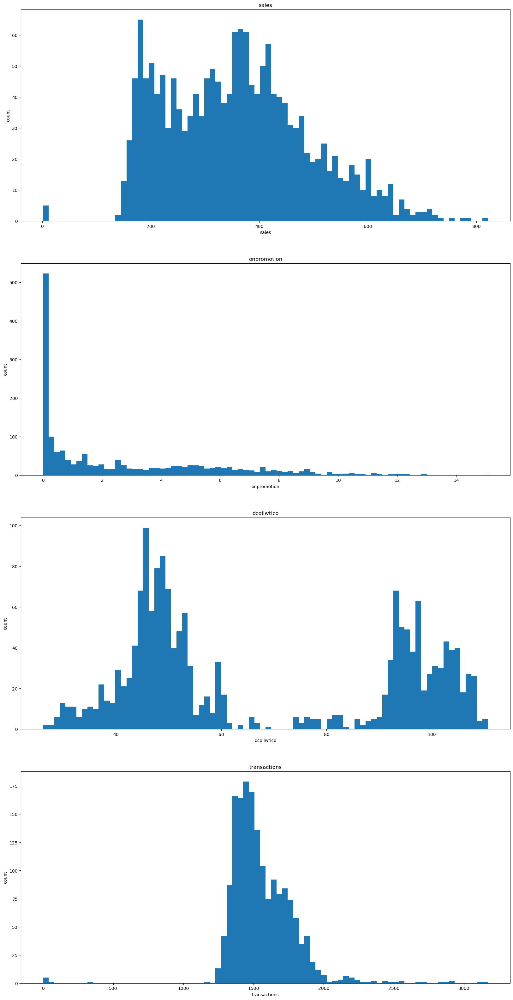

In [120]:
plt.figure(figsize=(20, 40))
for i, current_num_feature in enumerate(numerical_features):
    plt.subplot(len(numerical_features), 1, i + 1)
    plt.xlabel(current_num_feature)
    plt.ylabel('count')
    x = train_data.groupby('date')[current_num_feature].mean()
    plt.hist(x=x, bins=80)
    plt.title(current_num_feature)

<i>I'll describe these 4 plots one by one:<br> 1) 'Sales' plot. Distribution of means is not standard, and it is hard to say something about it, having no connection with datetime. But it interesting to explore values, which are out of the general distribution.</i>

In [121]:
date_and_mean_sales = train_data.groupby('date')['sales'].mean()
date_and_mean_sales_min = date_and_mean_sales[date_and_mean_sales < date_and_mean_sales.quantile(0.01)]
date_and_mean_sales_min

date
2013-01-01      1.409438
2013-01-10    145.332213
2013-01-17    150.111401
2013-01-24    138.746179
2013-01-29    148.422457
2013-01-31    152.218978
2013-02-21    150.230701
2013-02-26    151.753652
2013-03-12    152.538371
2013-03-14    138.912132
2013-03-21    151.027008
2013-04-25    150.836487
2013-06-27    149.565353
2014-01-01      4.827197
2015-01-01      7.168135
2016-01-01      9.221882
2017-01-01      6.780304
Name: sales, dtype: float64

<i>It means, that all the values in the left side of 'sales' distribution refer to New Year. That's why such data are <b>OUTLIERS</b></i>.

In [122]:
date_and_mean_sales_max = date_and_mean_sales[date_and_mean_sales > date_and_mean_sales.quantile(0.993)]
date_and_mean_sales_max

date
2016-04-03    710.947414
2016-04-17    713.711414
2016-04-18    755.286535
2016-05-01    712.750397
2016-12-04    716.158831
2016-12-18    707.335527
2016-12-23    719.498046
2017-01-02    786.928379
2017-04-01    821.034771
2017-05-01    733.276861
2017-06-04    772.453154
2017-07-02    727.485532
Name: sales, dtype: float64

<i>Most of these dates refer to the first days of the month - days, when people get their wages. This fact explains such high 'sales' values. It can be useful in the future: <b>FIRST DAYS OF MONTHS CAUSE BIG 'SALES' NUMBER</b>. What's more, we have an additional information in the task description:</i>
> A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.
<p><i>It means, that high 'sales' values on '2016-04-17', '2016-04-18', '2016-05-01' can be explained in this way. According to that, we can clasify observations in these 3 days as <b>outliers.</b><br> One interesting day is left: '2016-12-23'. It is not the wages-day and it can't be connected to the eartquake. Let's see, what can it be.</i>

In [123]:
holidays_events_data[holidays_events_data['date'].isin(('2016-04-03', '2016-10-02', '2016-12-04', '2016-12-18', '2016-12-23',
                                                        '2017-01-02', '2017-04-01', '2017-05-01', '2017-06-04', '2017-07-02'))]

,date,holiday_type,holiday_locale,holiday_locale_name,holiday_description,holiday_transferred
292,2016-12-23,Additional,National,Ecuador,Navidad-2,False
298,2017-01-02,Transfer,National,Ecuador,Traslado Primer dia del ano,False
302,2017-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
308,2017-05-01,Holiday,National,Ecuador,Dia del Trabajo,False


<i>I'm pretty sure that holidays these days are nothing more than coincidence. It is necessary to check it out, but I have no idea for that right now. (Actually, we will see later that the existance of the holiday doesn't correlate with the 'sales' at all.)</i>

In [124]:
onpromotion_data = train_data[train_data['date'].isin(('2016-04-03', '2016-10-02', '2016-12-04',
                                                       '2016-12-18', '2016-12-23', '2017-01-02',
                                                       '2017-04-01', '2017-05-01', '2017-06-04',
                                                       '2017-07-02'))].groupby('date')['onpromotion'].mean()
onpromotion_data

date
2016-04-03     2.857464
2016-10-02     5.616723
2016-12-04     8.521886
2016-12-18     9.667789
2016-12-23    12.082492
2017-01-02     6.628507
2017-04-01     4.180696
2017-05-01     7.145342
2017-06-04     5.898990
2017-07-02     7.790123
Name: onpromotion, dtype: float64

<i>That is what we need. A mean promotions value on the '2016-12-23' is very high (we can look on the 'onpromotion' plot and check it out). This fact could cause such a big 'sales' value. (in this case, we can't clasify observations that day as <b>OUTLIERS</b>, because they can help us while buiding a forecasting model)</i>

In [125]:
oil_price_data = train_data[train_data['date'].isin(('2016-04-02', '2016-04-03', '2016-10-01', '2016-10-02',
                                                  '2016-12-03', '2016-12-04', '2016-12-17', '2016-12-18',
                                                  '2016-12-22', '2016-12-23', '2017-01-01', '2017-01-02',
                                                  '2017-03-31', '2017-04-01', '2017-04-30', '2017-05-01',
                                                  '2017-06-03', '2017-06-04', '2017-07-01', '2017-07-02'))].groupby('date')['dcoilwtico'].mean()
oil_price_data

date
2016-04-02    35.36
2016-04-03    35.36
2016-10-01    47.72
2016-10-02    47.72
2016-12-03    51.70
2016-12-04    51.70
2016-12-17    51.93
2016-12-18    51.93
2016-12-22    51.98
2016-12-23    52.01
2017-01-01    53.75
2017-01-02    53.75
2017-03-31    50.54
2017-04-01    50.54
2017-04-30    49.31
2017-05-01    48.83
2017-06-03    47.68
2017-06-04    47.68
2017-07-01    46.02
2017-07-02    46.02
Name: dcoilwtico, dtype: float64

<i>As far as Ecuador is an oil-dependent country, it is necessary to check, if there were any shocks in oil prices these days. But here we can see that there were no shocks, that is why oil price didn't have impact on 'sales' values these days.</i>

<i>2) 'Onpromotion' plot. I don't think that here we can detect some interesting facts. It is necessary to look on the time-dependent plot to learn more about this feature.</i>

In [126]:
date_and_mean_promo = train_data.groupby('date')['onpromotion'].mean()
date_and_mean_promo_max = date_and_mean_promo[date_and_mean_promo > date_and_mean_promo.quantile(0.99)]
date_and_mean_promo_max

date
2016-11-02    12.251403
2016-11-09    12.016274
2016-11-23    11.497194
2016-12-07    15.073513
2016-12-14    12.193042
2016-12-21    13.146465
2016-12-23    12.082492
2016-12-28    13.262626
2016-12-30    12.331089
2017-01-04    12.860831
2017-04-26    11.863075
2017-05-03    11.886083
2017-05-10    11.387205
2017-05-24    11.700337
2017-06-21    11.789562
2017-07-05    12.934343
2017-07-12    11.350168
Name: onpromotion, dtype: float64

In [127]:
holidays_events_data[holidays_events_data['date'].isin(date_and_mean_promo_max.index)]

,date,holiday_type,holiday_locale,holiday_locale_name,holiday_description,holiday_transferred
275,2016-11-02,Holiday,National,Ecuador,Dia de Difuntos,False
289,2016-12-21,Additional,National,Ecuador,Navidad-4,False
292,2016-12-23,Additional,National,Ecuador,Navidad-2,False
312,2017-05-24,Holiday,National,Ecuador,Batalla de Pichincha,True


<i>All big promotions date back to the last year of the observaions time. And, as we can see, there were no holidays and events those days, that is why it seems that such <b>HIGH 'ONPROMOTION' VALUES HAVE NO CONNECTIONS WITH OTHER FEATURES</b>.
<p>3) Oil price is the independent feature in this task. Rather other features depend on oil price than vice versa.</i>

In [128]:
date_and_mean_transactions = train_data.groupby('date')['transactions'].mean()
date_and_mean_transactions_min = date_and_mean_transactions[date_and_mean_transactions < date_and_mean_transactions.quantile(0.01)]
date_and_mean_transactions_min

date
2013-01-01      14.259259
2013-01-10    1229.314815
2013-01-24    1179.722222
2013-02-11    1244.851852
2013-03-14    1248.018519
2013-06-27    1247.037037
2013-09-19    1244.611111
2013-09-26    1239.148148
2013-10-24    1252.018519
2013-11-14    1245.703704
2014-01-01      24.574074
2014-06-26    1262.759259
2015-01-01      40.777778
2016-01-01       0.000000
2016-01-03       0.000000
2016-01-04     330.166667
2017-01-01      30.407407
Name: transactions, dtype: float64

In [129]:
date_and_mean_transactions_max = date_and_mean_transactions[date_and_mean_transactions > date_and_mean_transactions.quantile(0.99)]
date_and_mean_transactions_max

date
2013-12-23    2701.407407
2013-12-24    2886.037037
2014-12-22    2492.111111
2014-12-23    2676.166667
2014-12-24    2899.000000
2014-12-31    2350.962963
2015-12-21    2309.462963
2015-12-22    2572.611111
2015-12-23    2839.592593
2015-12-24    3169.796296
2015-12-31    2441.222222
2016-12-21    2445.555556
2016-12-22    2572.074074
2016-12-23    2906.148148
2016-12-24    3102.629630
2016-12-30    2366.129630
2016-12-31    2510.518519
Name: transactions, dtype: float64

In [130]:
train_data[train_data['date'].isin(date_and_mean_transactions_max.index)].groupby('date')['sales'].mean()

date
2013-12-23    444.930014
2013-12-24    348.295898
2014-12-22    565.737007
2014-12-23    597.630737
2014-12-24    542.077930
2014-12-31    473.838647
2015-12-21    602.069291
2015-12-22    640.775482
2015-12-23    671.237967
2015-12-24    608.125878
2015-12-31    541.325220
2016-12-21    662.910958
2016-12-22    637.401454
2016-12-23    719.498046
2016-12-24    699.684536
2016-12-30    652.998338
2016-12-31    622.341645
Name: sales, dtype: float64

<i>4) 'Transactions' plot. Everything seems logical here. As far as 'sales' number is very low on the 1st January every year, 'transactions' value is also very low these days (in comparison with other values of this feature). As we decided earlier, such observations are outliers.
<br>If we look at the highest values of this feature, we see, that all these values date back to the days before Christmas Day. It is logical, because Ecuador is a catolic country, and Christmas Day is one of the most important holidays in the country, which is celebrated on the 25th December. I looked on the 'sales' values these days, and most of them are located on the right edge of the graph, that is why we can clasify observations these days as <b>OUTLIERS</b>.</i>

In [131]:
transactions_nan_data = train_data.loc[transactions_nan_ind, :]
transactions_nan_data.shape

(245784, 16)

In [132]:
number_of_nan_rows = transactions_nan_data.shape[0]
transactions_nan_data['holiday_type'].value_counts().sum() / number_of_nan_rows

0.16326530612244897

<i>My guess is wrong. Existence of a holiday does not affect the 'transactions' value. Probably, the information about what is the reason of NaN 'transactions' isn't available for us.</i>

In [133]:
def format_time_axis(ax):
    ax.xaxis.set_major_formatter(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_tick_params(which='major', rotation=90)

    ax.xaxis.set_minor_formatter(mdates.MonthLocator())
    ax.xaxis.set_minor_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_tick_params(which='minor', rotation=90)

In [134]:
train_data['date'] = pd.to_datetime(train_data['date'])

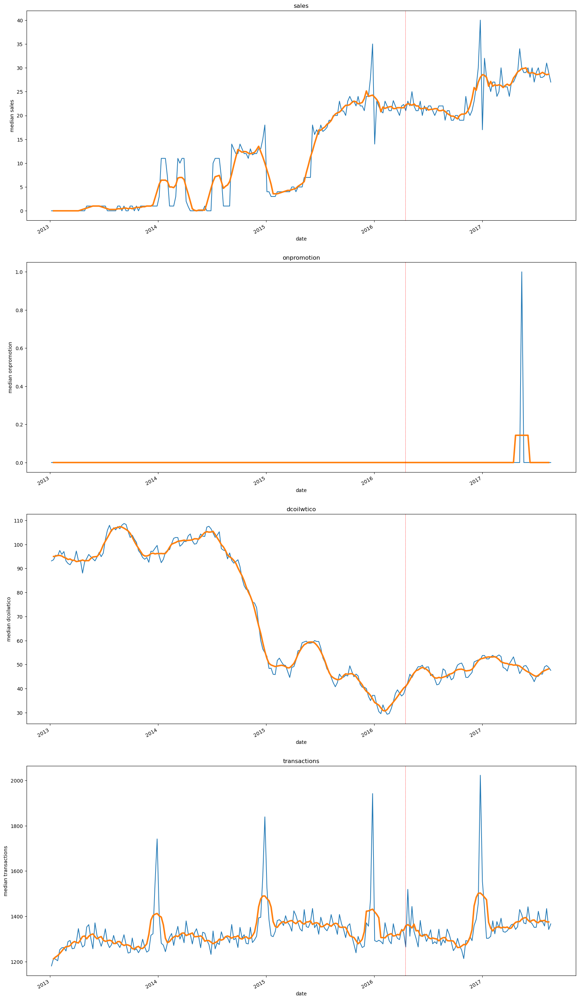

In [135]:
plt.figure(figsize=(20, 40))
for i, current_num_feature in enumerate(numerical_features):
    plt.subplot(len(numerical_features), 1, i + 1)
    #format_time_axis(ax)
    x = train_data.groupby(pd.Grouper(key='date', freq='W'))[current_num_feature].median()
    trend = x.rolling(window=7, center=True, min_periods=5).mean()
    plt.plot(x)
    trend.plot(x=x, linewidth=3)
    plt.axvline(pd.to_datetime('2016-04-16'), color='r', linestyle='--', lw=0.5)
    plt.xlabel('date')
    plt.ylabel('median ' + current_num_feature)
    plt.title(current_num_feature)

<i>These trend plots prove guesses about extreme values of 'sales' and 'transactions' numerical features
    <br>'Onpromotion' median is mostly zero, so the graph is uninformative. Let's plot this feature in a separate cell being aggregated with mean.
</i>

Text(0.5, 1.0, 'onpromotion')

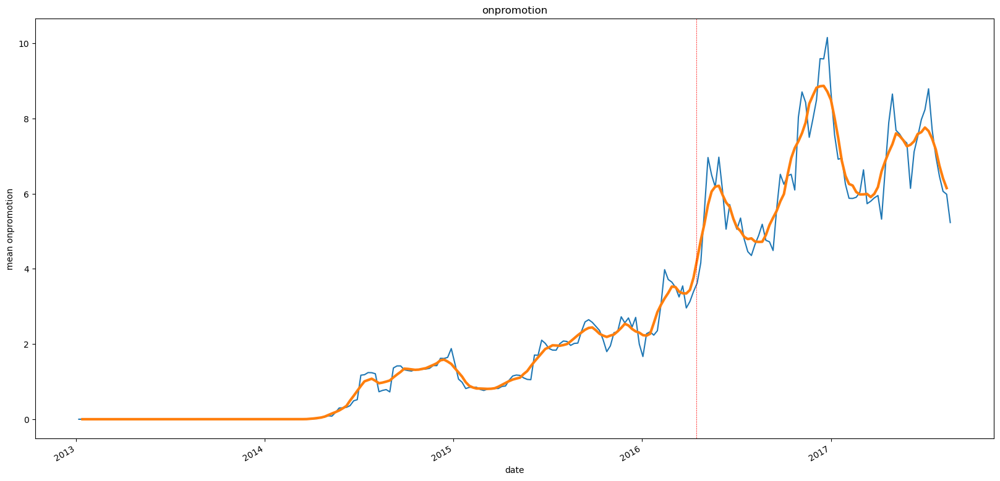

In [136]:
plt.figure(figsize=(20, 10))
x = train_data.groupby(pd.Grouper(key='date', freq='W'))['onpromotion'].mean()
trend = x.rolling(window=7, center=True, min_periods=5).mean()
plt.plot(x)
trend.plot(x=x, linewidth=3)
plt.axvline(pd.to_datetime('2016-04-16'), color='r', linestyle='--', lw=0.5)
plt.xlabel('date')
plt.ylabel('mean onpromotion')
plt.title('onpromotion')

<i>As we can see on this graph, 'onpromotion' feature has a positive dynamic. There are shocks in promo values and it is necessary to check, what do they mean. (one of them can be explained by the earthquake: people united to help injured persons, a lot of goods had big sales to let people buy as much products as it needed)</i>

##### Onpromotion in train and test sets

In [137]:
test_data = pd.read_csv(DATA_ROOT / 'test.csv')
test_data.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [138]:
X = train_data.copy()

In [139]:
first_day_of_last_year = pd.to_datetime(X['date'].unique()[-1]) - pd.Timedelta(days=365)
indexer = X[X['date'] >= str(first_day_of_last_year).split(' ')[0]].index
X_train = X[X['date'] >= str(first_day_of_last_year).split(' ')[0]]

In [140]:
print('Percentage of zeros:')
print('Train: ', (X_train['onpromotion'] == 0).mean())
print('Test: ', (test_data['onpromotion'] == 0).mean())

Percentage of zeros:
Train:  0.5621419676214197
Test:  0.5591680695847363


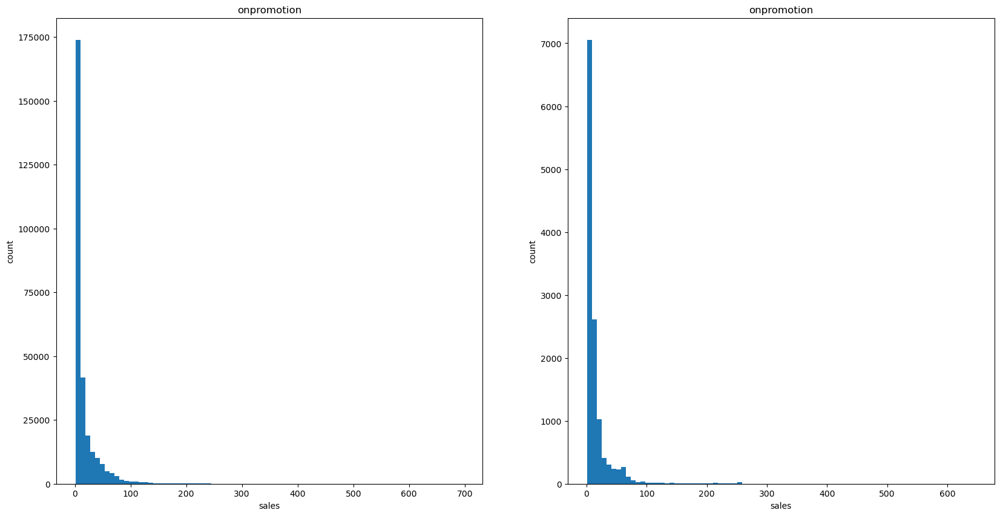

In [141]:
plt.figure(figsize=(20, 10))
for i, df in enumerate([X_train, test_data]):
    plt.subplot(1, 2, i + 1)
    plt.xlabel('sales')
    plt.ylabel('count')
    x = df[df['onpromotion'] != 0]['onpromotion']
    plt.hist(x=x, bins=80)
    plt.title('onpromotion')

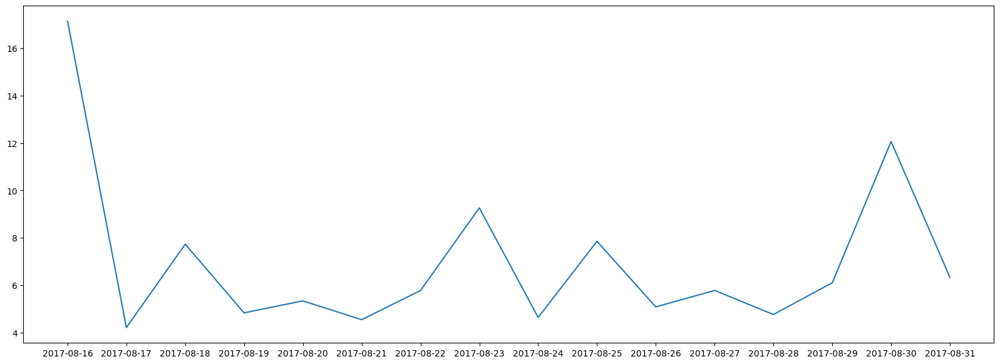

In [146]:
plt.figure(figsize=(20, 7))
plt.plot(test_data.groupby('date')['onpromotion'].mean())

<AxesSubplot: xlabel='date'>

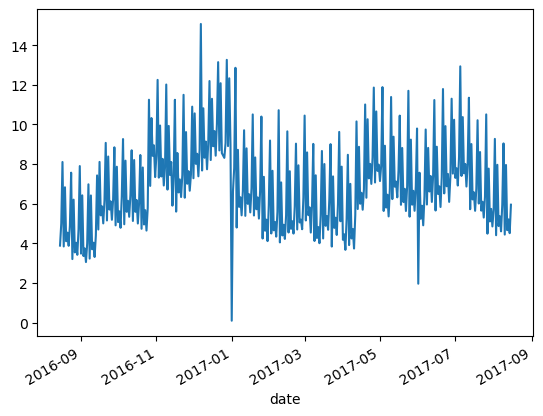

In [147]:
X_train.groupby('date')['onpromotion'].mean().plot()

In [148]:
test_data.describe(percentiles=[.25, 0.375, .5, .75, .875, .95]).drop(['count'])

,id,store_nbr,onpromotion
mean,3.015144e+06,27.500000,6.965383
std,8.230850e+03,15.586057,20.683952
min,3.000888e+06,1.000000,0.000000
25%,3.008016e+06,14.000000,0.000000
37.5%,3.011580e+06,21.000000,0.000000
50%,3.015144e+06,27.500000,0.000000
75%,3.022271e+06,41.000000,6.000000
87.5%,3.025835e+06,48.000000,14.000000
95%,3.027973e+06,52.000000,35.000000
max,3.029399e+06,54.000000,646.000000


In [149]:
train_data.describe(percentiles=[.25, 0.375, .5, .75, .875, .95]).drop(['count'])

,store_nbr,sales,onpromotion,store_cluster,dcoilwtico,transactions
mean,27.500000,357.775749,2.602770,8.481481,67.924899,1555.807876
std,15.585787,1101.997721,12.218882,4.649735,25.669131,1033.367465
min,1.000000,0.000000,0.000000,1.000000,26.190000,0.000000
25%,14.000000,0.000000,0.000000,4.000000,46.377500,930.000000
37.5%,21.000000,2.000000,0.000000,6.000000,49.360000,1152.000000
50%,27.500000,11.000000,0.000000,8.500000,53.410000,1331.000000
75%,41.000000,195.847250,0.000000,13.000000,95.720000,1976.250000
87.5%,48.000000,637.950875,2.000000,15.000000,101.820000,2770.125000
95%,52.000000,1965.000000,13.000000,15.000000,105.230000,3636.000000
max,54.000000,124717.000000,741.000000,17.000000,110.620000,8359.000000


# Categorical data distribution

In [150]:
print("Number of unique values:  \n")
print(train_data[categorical_features].nunique())

Number of unique values:  

family                 33
store_city             22
store_state            16
store_type              5
holiday_type            6
holiday_locale          3
holiday_locale_name    23
holiday_description    93
holiday_transferred     2
store_nbr              54
store_cluster          17
dtype: int64


In [151]:
cat_features_hist = ['family', 'store_city', 'holiday_locale_name', 'store_nbr']
cat_features_pie = ['store_state', 'store_type', 'holiday_type', 'holiday_locale', 'holiday_transferred', 'store_cluster']

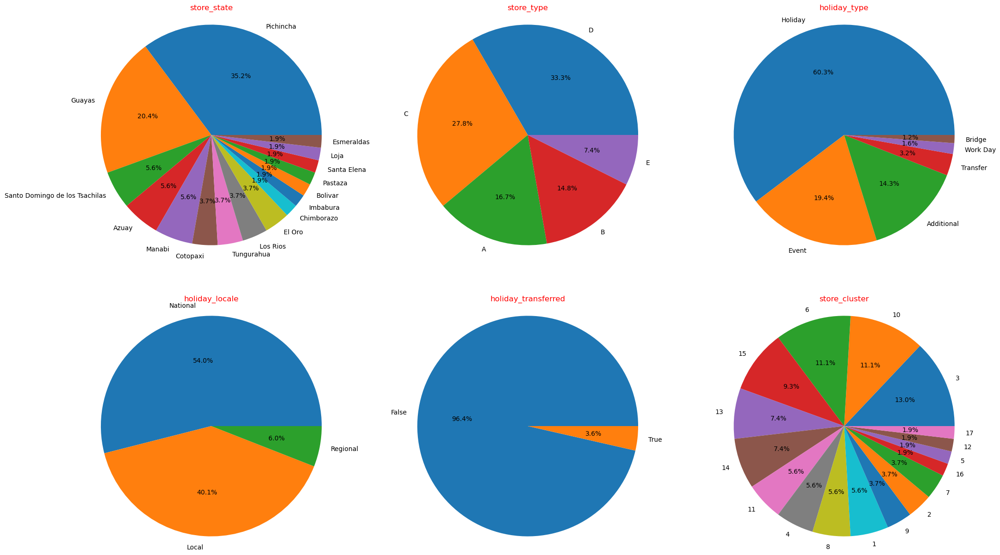

In [152]:
plt.figure(figsize=(25, 15))
for i, current_cat_column in enumerate(cat_features_pie):
    plt.subplot(2, 3, i + 1)
    n = train_data[current_cat_column].value_counts()
    plt.pie(n, labels=n.index, radius=1800, autopct='%1.1f%%')
    plt.axis('equal')
    plt.title(current_cat_column, color='red')

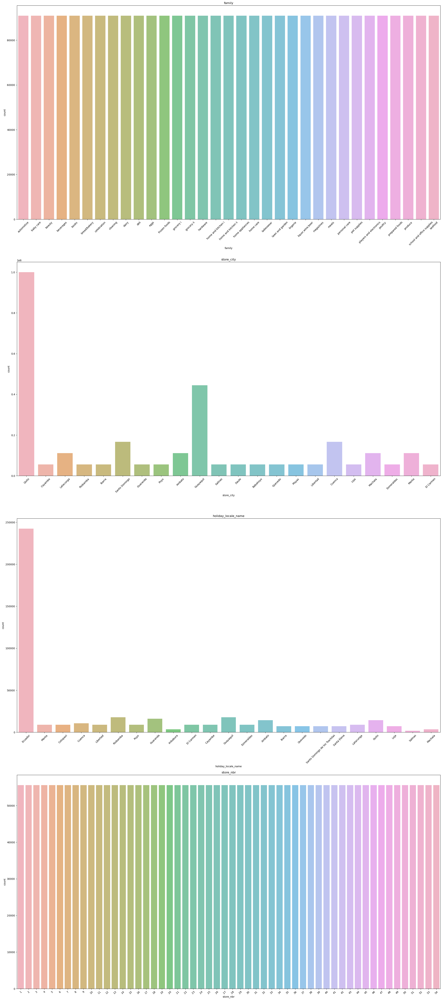

In [153]:
plt.figure(figsize=(30, 70))
for i, cat_feature in enumerate(cat_features_hist):
    plt.subplot(len(cat_features_hist), 1, i + 1)
    plt.xlabel(cat_feature)
    plt.ylabel('count')
    sns.countplot(x=train_data[cat_feature], alpha=0.7)
    plt.xticks(rotation=45)
    plt.title(cat_feature)

# Correlations between variables

In [154]:
train_data_copy = train_data.copy().set_index('date')
train_data_copy = pd.get_dummies(train_data_copy)
train_data_copy.shape

(3000888, 209)

In [155]:
corr_coefficients = (train_data_copy.corr().where(np.triu(np.ones(train_data_copy.corr().shape), k=1).astype(bool))
                  .stack()
                  .sort_values(ascending=False))

In [156]:
corr_coefficients[:30]

holiday_locale_name_Salinas                         holiday_description_Cantonizacion de Salinas              1.000000
holiday_locale_name_Esmeraldas                      holiday_description_Fundacion de Esmeraldas               1.000000
holiday_locale_name_Cuenca                          holiday_description_Fundacion de Cuenca                   1.000000
holiday_locale_name_Cotopaxi                        holiday_description_Provincializacion de Cotopaxi         1.000000
holiday_locale_name_Quevedo                         holiday_description_Cantonizacion de Quevedo              1.000000
store_city_Esmeraldas                               store_state_Esmeraldas                                    1.000000
holiday_locale_name_Puyo                            holiday_description_Cantonizacion del Puyo                1.000000
holiday_locale_name_Cayambe                         holiday_description_Cantonizacion de Cayambe              1.000000
holiday_locale_National                         

In [157]:
corr_coefficients[:-10:-1]

store_type_C          store_type_D            -0.438529
store_state_Guayas    store_state_Pichincha   -0.372653
store_city_Quito      store_state_Guayas      -0.357641
transactions          store_type_C            -0.344759
store_nbr             store_state_Pichincha   -0.317227
store_type_A          store_type_D            -0.316228
store_nbr             store_type_D            -0.310019
store_city_Guayaquil  store_state_Pichincha   -0.307262
store_type_B          store_type_D            -0.294884
dtype: float64

<i>The highest correlation coefficients refer to pairs like 'state' - 'city' or 'event_type' - 'description' or 'locale_name' - 'description', which don't give us any new information. As we will see later, all information about holidays is excess, because the correlation between a binary feature indicating the existence of a holiday on a particular day and all other features is very close to zero.</i>

In [158]:
train_data_copy = train_data.copy().drop(['holiday_type', 'holiday_locale', 'holiday_locale_name', 
                                          'holiday_description', 'store_state'], axis=1)
train_data_copy['holiday_transferred'] = np.where((train_data_copy['holiday_transferred'] == True), 1, train_data_copy['holiday_transferred'])
train_data_copy['holiday_transferred'] = np.where((train_data_copy['holiday_transferred'] == False), 1, train_data_copy['holiday_transferred'])
train_data_copy['holiday_transferred'] = train_data_copy['holiday_transferred'].fillna(0)
train_data_copy['holiday_transferred'].value_counts()

is_holiday = pd.get_dummies(train_data_copy['holiday_transferred'])
train_data_copy = pd.concat((is_holiday, train_data_copy), axis=1)
train_data_copy = train_data_copy.rename(columns={1: "is_holiday"})
train_data_copy = train_data_copy.drop([0, 'holiday_transferred'], axis=1)

train_data_copy['transactions'] = train_data_copy['transactions'].fillna(0)

train_data_copy = pd.get_dummies(train_data_copy)

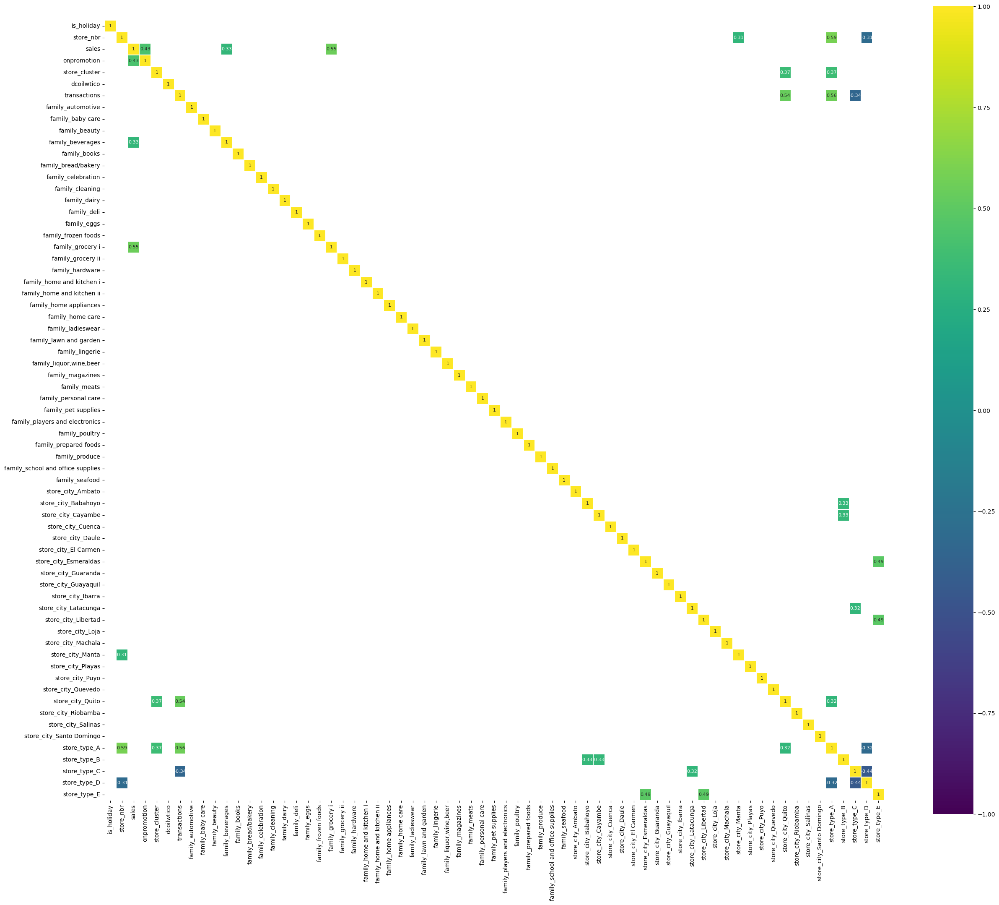

In [159]:
corr = train_data_copy.corr()
plt.figure(figsize=(30, 25))

sns.heatmap(corr[(corr >= 0.3) | (corr <= -0.3)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

<i>That is the prove: there is no correlation between 'is_holiday' feature and other features. It means that <b>MAYBE THERE IS NO REASON TO SAVE ALL THE FEATURES, WHICH DESCRIBE HOLIDAYS AND EVENTS</b> - their influence on target and other features is very close to 0.</i>

<i>Some more interesting findings from this graph:
    <br>- <b>target ('sales') correlates well with 'onptomotions' feature</b> (it is obvious) <b> with two goods categories: 'beverages' and 'grocery'</b> can be explained in this way: beverages and especially gracery goods are first consumption goods, that is why number of 'sales' is always pretty high.
    <br>- some store types, such as 'store_type_A' and 'store_type_C' correlate well with 'transactions' feature. It means that if observation refered to 'store_type_A', 'transactions' value would be bigger than if observation refered to any other 'store_type'. There is an opposite situation, when we are talking about 'store_type_C'.
    <br>- some cities correlates well with store types (for example, 'city_Quito' with 'store_type_A'). It means that in Quoto city there are a lot of stores with type 'A' in comparison with other store types. And this fact cause that, for example, 'city_Quoto' correlates well with 'transactions' feature.</i>

In [160]:
black_friday_data = train_data[train_data['holiday_description'] == 'Black Friday'].groupby('date')['sales'].mean()
black_friday_data

date
2014-11-28    314.040306
2015-11-27    362.001703
2016-11-25    414.040115
Name: sales, dtype: float64

# Dependence on the target

<i>In this part I'd like to explore the connection with the target of the following features: 'family', 'onpromotion' and 'dcoilwtico', because 'onpromotion' feature correlates well with the target, the same as some categories from 'family' feature. It is interesting that oil price doesn't correlate well with the 'sales' feature, because Ecuador economy is oil-dependent. But maybe there is more complex dependency between these two features.</i>

Text(0.5, 1.0, 'transactions and mean sales')

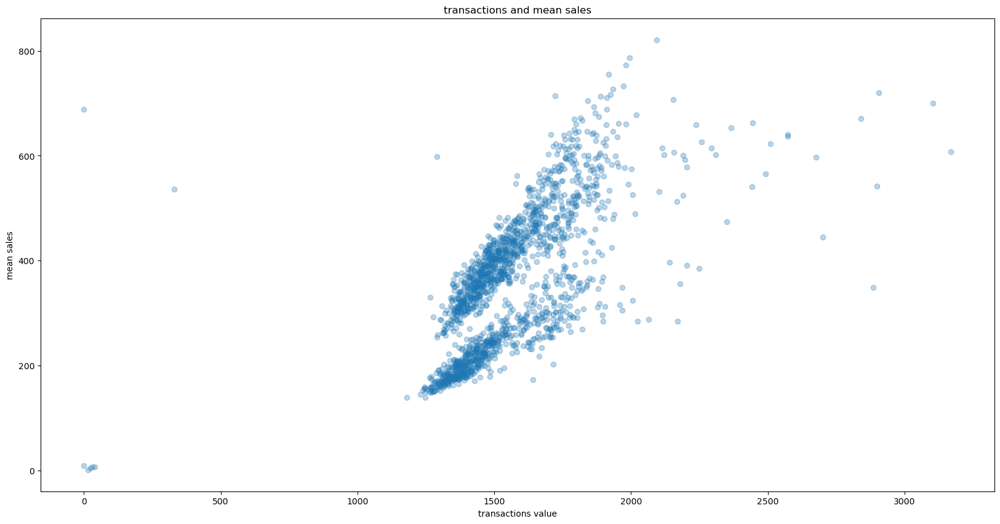

In [161]:
plt.figure(figsize=(20, 10))
transactions_and_sales_data = train_data.groupby('date')[['transactions', 'sales']].mean()
plt.xlabel('transactions value')
plt.ylabel('mean sales')
plt.scatter(x='transactions', y='sales', data=transactions_and_sales_data, alpha=0.3)
plt.title('transactions and mean sales')

In [162]:
transactions_and_sales_data.corr()

,transactions,sales
transactions,1.000000,0.656308
sales,0.656308,1.000000


Text(0.5, 1.0, 'transactions and median sales')

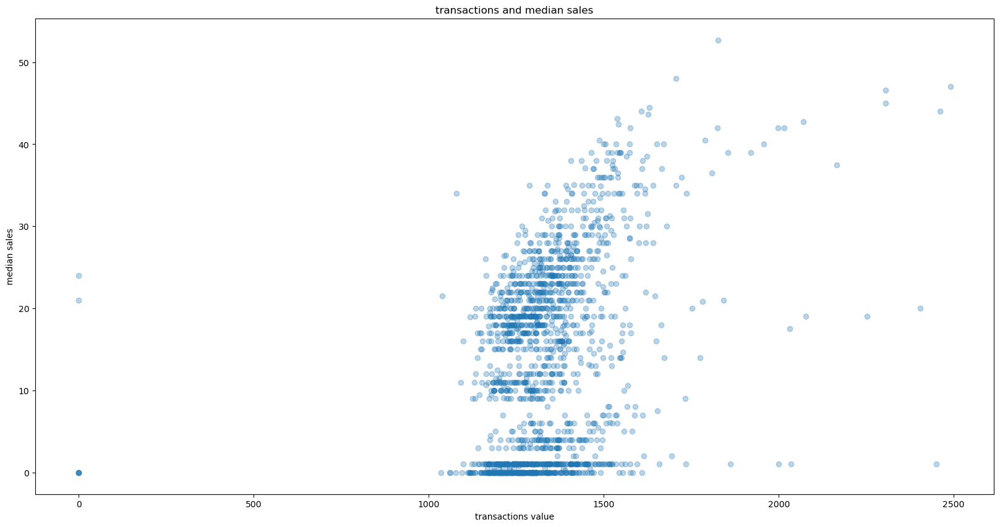

In [163]:
plt.figure(figsize=(20, 10))
transactions_and_sales_data = train_data.groupby('date')[['transactions', 'sales']].median()
plt.xlabel('transactions value')
plt.ylabel('median sales')
plt.scatter(x='transactions', y='sales', data=transactions_and_sales_data, alpha=0.3)
plt.title('transactions and median sales')

In [164]:
transactions_and_sales_data.corr()

,transactions,sales
transactions,1.000000,0.356482
sales,0.356482,1.000000


<i>Here we can see that <b>CORRELATION BETWEEN TRANSACTIONS AND SALES IS PRETTY BIG</b> (if we're talking about mean values), that is why it is necessary to use this feature in our forecasting model.</i>

Text(0.5, 1.0, 'oil price and mean sales')

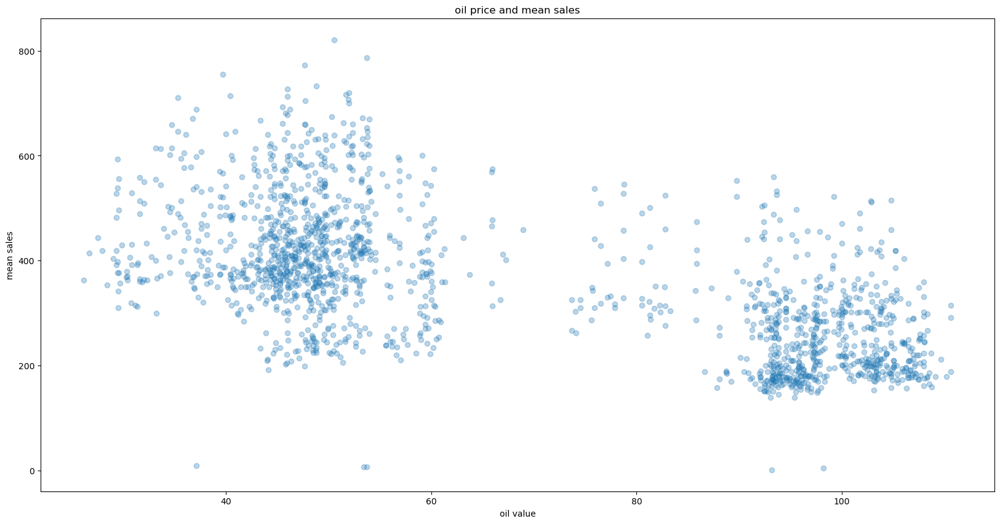

In [165]:
plt.figure(figsize=(20, 10))
oil_and_sales_data = train_data.groupby('date')[['dcoilwtico', 'sales']].mean()
plt.xlabel('oil value')
plt.ylabel('mean sales')
plt.scatter(x='dcoilwtico', y='sales', data=oil_and_sales_data, alpha=0.3)
plt.title('oil price and mean sales')

In [166]:
oil_and_sales_data.corr()

,dcoilwtico,sales
dcoilwtico,1.000000,-0.626889
sales,-0.626889,1.000000


Text(0.5, 1.0, 'oil price and median sales')

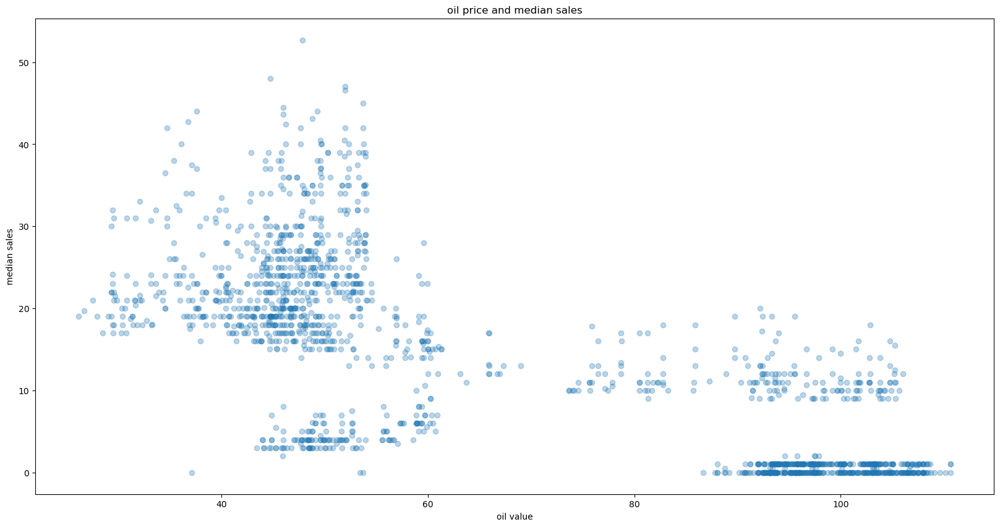

In [167]:
plt.figure(figsize=(20, 10))
oil_and_sales_data = train_data.groupby('date')[['dcoilwtico', 'sales']].median()
plt.xlabel('oil value')
plt.ylabel('median sales')
plt.scatter(x='dcoilwtico', y='sales', data=oil_and_sales_data, alpha=0.3)
plt.title('oil price and median sales')

In [168]:
oil_and_sales_data.corr()

,dcoilwtico,sales
dcoilwtico,1.000000,-0.754987
sales,-0.754987,1.000000


<i>Here we can see that <b>CORRELATION BETWEEN OIL PRICE AND SALES IS BIG.</b> The last time the correlation coefficient was calculated incorrectly because the sales values per day were not averaged. Now everything is logical. Moreover, the second value is more fair, because there we calculated correlation coefficient with the help of the median 'sales' value. (more resistant to outliers)</i>

In [169]:
family_values = train_data['family'].unique()

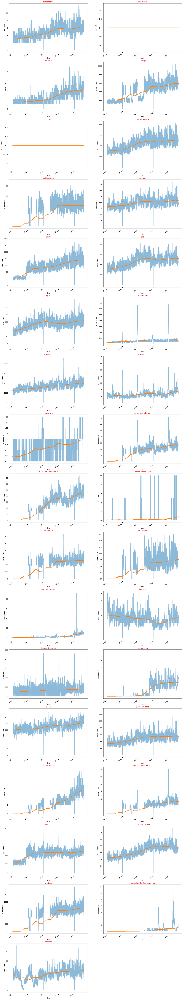

In [170]:
plt.figure(figsize=(20, 130))
for i, family in enumerate(family_values):
    plt.subplot(17, 2, i + 1)
    average_sales = train_data[train_data['family'] == family].groupby('date')['sales'].median()
    trend = average_sales.rolling(window=365, center=True, min_periods=183).mean()
    plt.ylabel('mean sales')
    plt.axvline(pd.to_datetime('2016-04-16'), color='r', linestyle='--', lw=0.5)
    ax = average_sales.plot(alpha=0.5)
    ax = trend.plot(ax=ax, linewidth=3)
    plt.title(family, color='red')

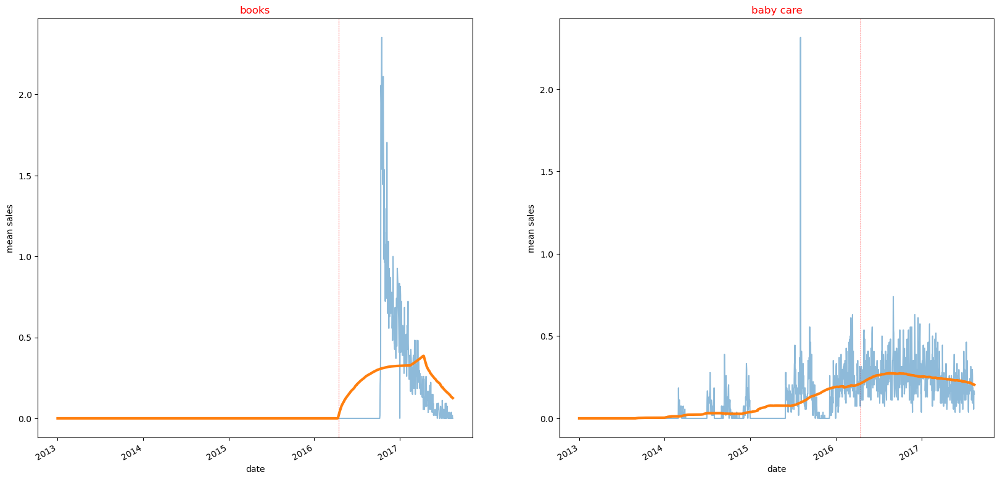

In [171]:
plt.figure(figsize=(20, 10))
for i, family in enumerate(['books', 'baby care']):
    plt.subplot(1, 2, i + 1)
    average_sales = train_data[train_data['family'] == family].groupby('date')['sales'].mean()
    trend = average_sales.rolling(window=365, center=True, min_periods=4).mean()
    plt.ylabel('mean sales')
    plt.axvline(pd.to_datetime('2016-04-16'), color='r', linestyle='--', lw=0.5)
    ax = average_sales.plot(alpha=0.5)
    ax = trend.plot(ax=ax, linewidth=3)
    plt.title(family, color='red')

<i>We can say that the number of sales in general has a positive dynamic (for example, 'automotive', 'bread/bakery', 'grocery i', 'personal care', ...).<br>Some of the product types have a negative dynamic (such as lingerie).<br>Some goods have very interesting sales distribution (books, produce, home care, ladieswear, ...), and we can't say right now, what is the reason of that.<br>Also some goods families have seasonal increase in sales('school and office supplies', 'liquor, wine, beer', 'grocery ii', 'frozen foods'). It is necessary to make deseasonalized plots, they will help better understand trends. I'll do it later.
    <p>Now let's have a look on some spikes and drops in 'sales', which don't belong to the general trend.
</i>

<b>BOOKS</b>

In [172]:
date_and_books_mean = train_data[train_data['family'] == 'books'].groupby('date')['sales'].mean()
date_and_books_mean_max = date_and_books_mean[date_and_books_mean > 0]
date_and_books_mean_max.head(10)

date
2016-10-08    0.018519
2016-10-09    0.203704
2016-10-10    0.259259
2016-10-11    0.370370
2016-10-12    2.055556
2016-10-13    2.018519
2016-10-14    1.925926
2016-10-15    2.166667
2016-10-16    2.351852
2016-10-17    1.537037
Name: sales, dtype: float64

<i>'2016-10-08' is a date which corresponds to the begginning of books sales.</i>

In [173]:
holidays_events_data[holidays_events_data['date'] == '2016-10-08']

,date,holiday_type,holiday_locale,holiday_locale_name,holiday_description,holiday_transferred


In [174]:
books_promotions = train_data[train_data['family'] == 'books'].groupby('date')['onpromotion'].mean()
books_promotions[books_promotions.index == '2016-10-08']

date
2016-10-08    0.0
Name: onpromotion, dtype: float64

In [175]:
date_and_books_mean_max.shape

(287,)

In [176]:
transactions_and_books_mean = train_data[train_data['family'] == 'books'].groupby('date')['transactions'].mean()
transactions_and_books_mean[transactions_and_books_mean > 0].shape

(1682,)

<b>!!!</b>

<i>It seems to be illogical: when we are talking about books, mean 'transactions' value is more that 0 almost every day since observations started (1682 days). But, as fas as we know, books 'sales' became more than 0 only on '2016-10-08' (287 days in general).</i>

<b>LAWN AND GARDEN</b>

In [177]:
date_and_garden_mean = train_data[train_data['family'] == 'lawn and garden'].groupby('date')['sales'].mean()
date_and_garden_mean_max = date_and_garden_mean[date_and_garden_mean > 50]
date_and_garden_mean_max

date
2017-02-13     66.685185
2017-02-14    101.722222
2017-05-13    128.944444
Name: sales, dtype: float64

In [178]:
garden_data = train_data[train_data['date'].isin(('2017-02-13', '2017-02-14', '2017-05-13'))]
garden_data = garden_data[garden_data['family'] == 'lawn and garden']
garden_data = garden_data.groupby('date')['onpromotion'].mean()
garden_data

date
2017-02-13    0.037037
2017-02-14    0.685185
2017-05-13    0.018519
Name: onpromotion, dtype: float64

In [179]:
garden_full_data = sorted(train_data[train_data['family'] == 'lawn and garden'].groupby('date')['onpromotion'].mean().tolist())
garden_full_data[:-10:-1]

[3.925925925925926,
 3.6296296296296298,
 3.574074074074074,
 3.5185185185185186,
 3.5,
 3.5,
 3.5,
 3.4814814814814814,
 3.4814814814814814]

In [180]:
holidays_events_data[holidays_events_data['date'].isin(('2017-02-13', '2017-02-14', '2017-05-13'))]

,date,holiday_type,holiday_locale,holiday_locale_name,holiday_description,holiday_transferred
310,2017-05-13,Additional,National,Ecuador,Dia de la Madre-1,False


In [181]:
train_data[train_data['date'].isin(('2017-02-11', '2017-02-12', '2017-02-13', 
                                                  '2017-02-14', '2017-05-12', '2017-05-13'))].groupby('date')['dcoilwtico'].mean()

date
2017-02-11    53.84
2017-02-12    53.84
2017-02-13    52.96
2017-02-14    53.21
2017-05-12    47.83
2017-05-13    47.83
Name: dcoilwtico, dtype: float64

Text(0.5, 1.0, 'lawn and garden sales')

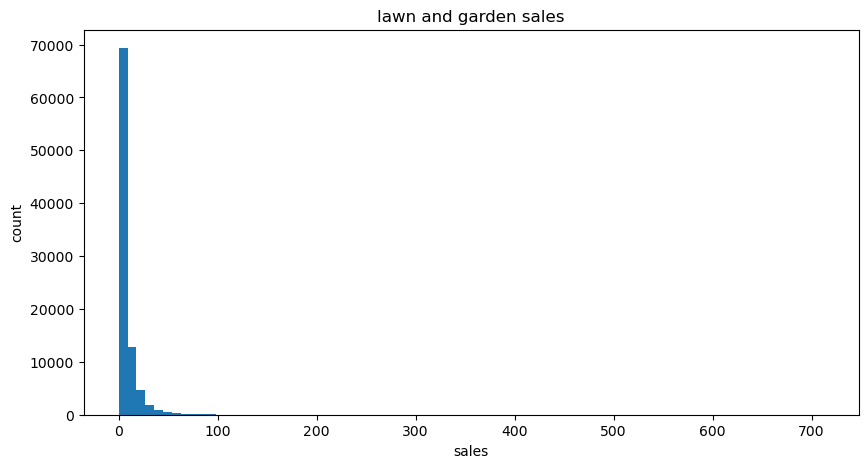

In [182]:
plt.figure(figsize=(10, 5))
plt.xlabel('sales')
plt.ylabel('count')
x = train_data[train_data['family'] == 'lawn and garden']['sales']
plt.hist(x=x, bins=80)
plt.title('lawn and garden sales')

In [183]:
all_lawn_and_garden_data = train_data[train_data['family'] == 'lawn and garden']
len(all_lawn_and_garden_data[all_lawn_and_garden_data['sales'] > 100].index) / len(all_lawn_and_garden_data.index)

0.001198645201020498

In [184]:
lawn_and_garden_max_sales = train_data[train_data['date'].isin(('2017-02-13', '2017-02-14', '2017-05-13'))]
lawn_and_garden_max_sales = lawn_and_garden_max_sales[lawn_and_garden_max_sales['family'] == 'lawn and garden']['sales']
lawn_and_garden_max_sales[lawn_and_garden_max_sales > 100]

2673548    181.0
2673647    252.0
2673746    157.0
2673911    111.0
2673977    132.0
           ...  
2833169    712.0
2833202    199.0
2833301    141.0
2833334    277.0
2833367    151.0
Name: sales, Length: 66, dtype: float64

<i>These observations are <b>OUTLIERS</b></i>.

<i><b>GROCERY I</b></i>

In [185]:
gracery_and_mean_sales_data = train_data[train_data['family'] == 'grocery i'].groupby('date')[['date', 'sales']].mean()
gracery_and_mean_sales_data[gracery_and_mean_sales_data['sales'] > 8000]

,sales
date,
2016-04-17,8451.350741
2016-04-18,10800.416296
2016-04-19,8014.494167
2016-04-21,8112.223556
2017-04-01,8777.850111


<i>First four observations are outliers (they connect with the earthquake).</i>

In [186]:
gracery_data = train_data[train_data['date'] == '2017-04-01']
gracery_data = gracery_data[gracery_data['family'] == 'grocery i']
gracery_data['onpromotion'].mean()

50.7962962962963

In [187]:
holidays_events_data[holidays_events_data['date'] == '2017-04-01']

,date,holiday_type,holiday_locale,holiday_locale_name,holiday_description,holiday_transferred
302,2017-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False


<i>Probably such big 'sales' value on '2017-04-01' is a result of two facts: first day of the month -> people get their wages; pretty big promotion 'value' (only 1% of all observations in the dataset have bigger 'onpromotion' value). That is why it is not an outlier.</i>

C:\Users\Owner\anaconda3\envs\mentorship_EPAM\lib\site-packages\seaborn\axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


<Figure size 2000x7000 with 0 Axes>

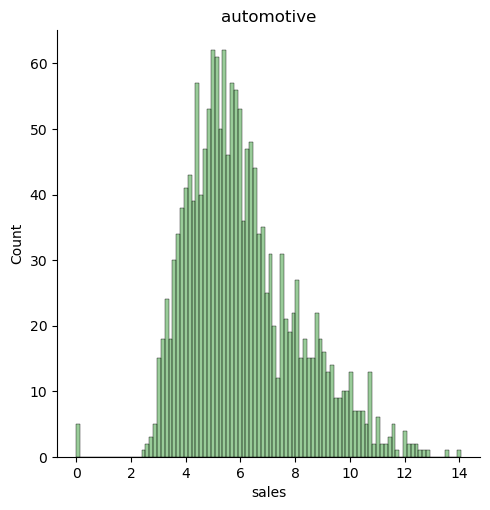

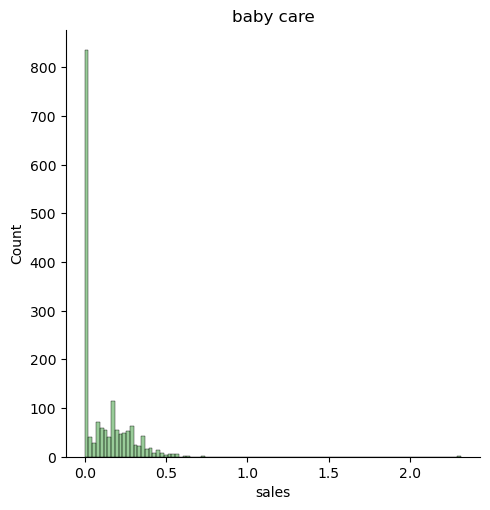

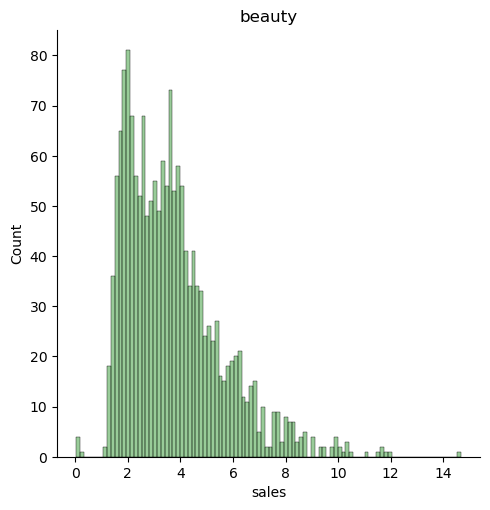

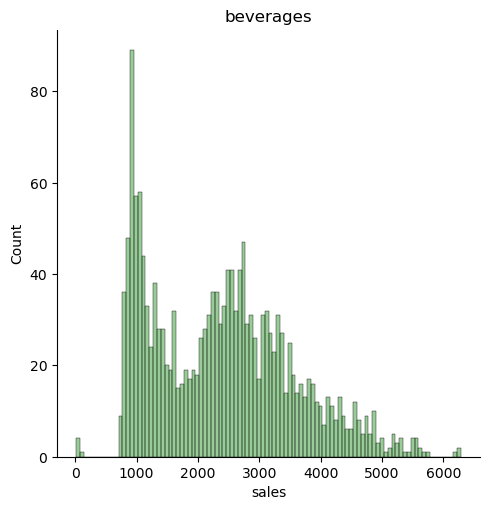

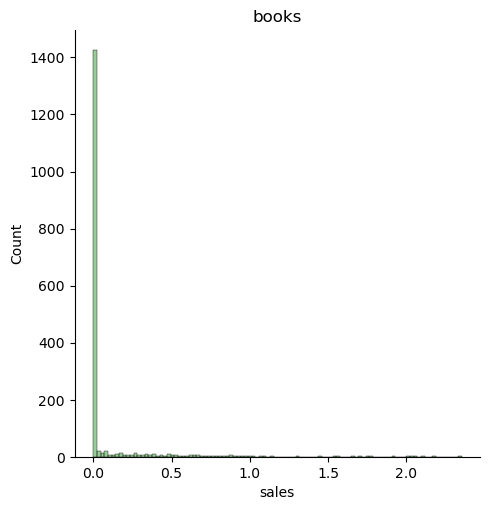

...

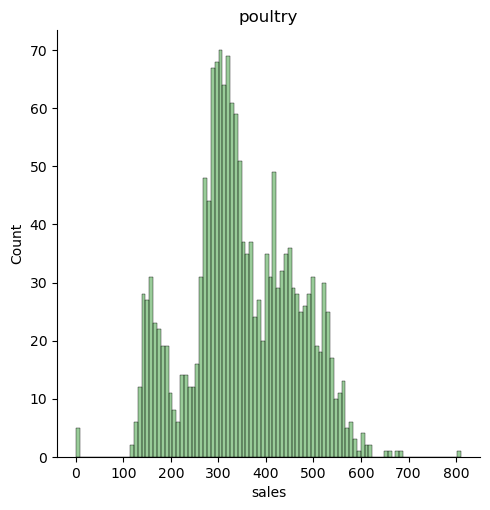

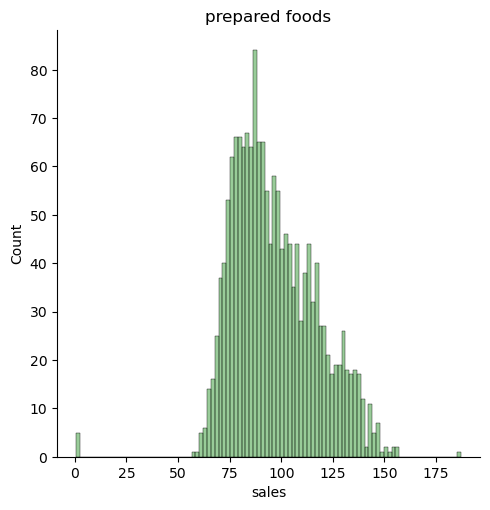

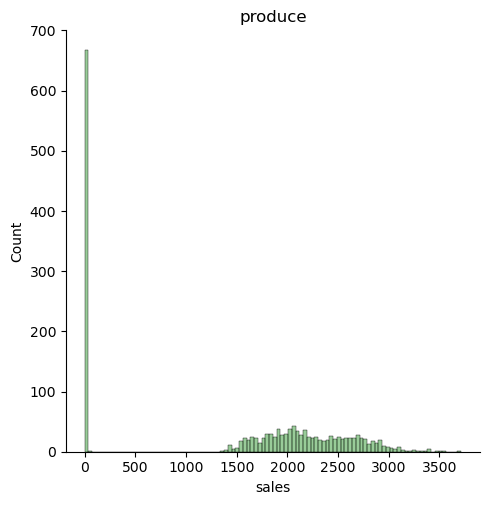

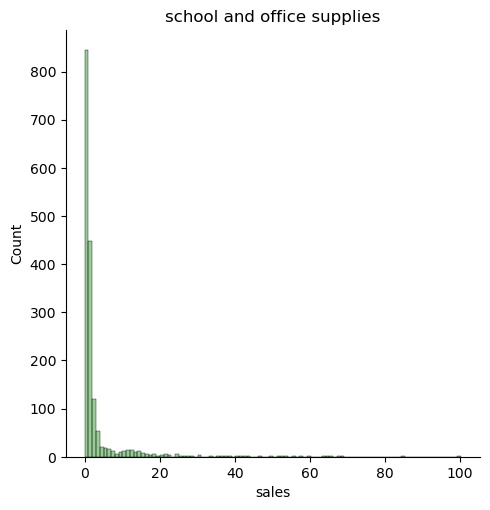

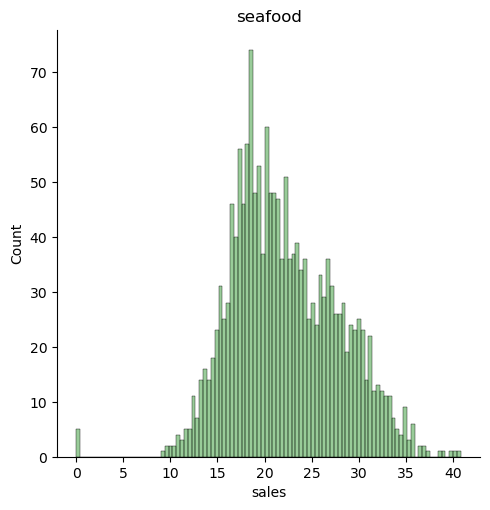

In [201]:
plt.figure(figsize=(20, 70))
for i, family in enumerate(family_values):
    current_value_data = train_data[train_data['family'] == family].groupby('date')['sales'].mean()
    sns.displot(current_value_data, color='g', bins=100, alpha=0.4)
    plt.title(family)

<i>These plots show that, roughly speaking, sales distributions of all families divided on two parts: <br>1) Normal or close to normal (such as 'automotive', 'bread/bakery', 'cleaning', 'eggs', 'grocery', 'lingerie', ...). Interesting fact that most of distributions from this category have right asymmetry (asymmetry coefficient is positive). The prove is below.<br>2) Distribution, where the biggest density is concentrated in zero or near zero. Other data is distributed differently (some values such as 'home and kitchen i', 'ladieswear' have something like normal distributions). It means that such goods categories aren't essential for people, that is why a number of sales during the day mostly is equal to 0.
    <p><b>Interesting fact: first consumption goods are normally distributed, and seasonal goods that do not have a constant demand are distributed differently.</b>
</i>

In [202]:
for family in family_values:
    skew = train_data[train_data['family'] == family].groupby('date')['sales'].mean().skew()
    print(f'{family}: {skew:.2f}')

automotive: 0.75
baby care: 2.92
beauty: 1.26
beverages: 0.50
books: 5.04
bread/bakery: 0.56
celebration: 0.29
cleaning: 0.66
dairy: 0.25
deli: 0.52
eggs: 0.73
frozen foods: 6.40
grocery i: 0.89
grocery ii: 3.16
hardware: 0.60
home and kitchen i: 0.43
home and kitchen ii: 0.82
home appliances: 0.26
home care: 0.08
ladieswear: 0.69
lawn and garden: 8.01
lingerie: 1.28
liquor,wine,beer: 1.83
magazines: 1.00
meats: 6.73
personal care: 0.95
pet supplies: 0.41
players and electronics: 0.43
poultry: 0.04
prepared foods: 0.28
produce: -0.14
school and office supplies: 5.81
seafood: 0.25


<i>Let's exclude zeros from second-type families and re-build distributions.</i>

In [203]:
second_type_families = ['baby care', 'books', 'celebration', 'home and kitchen i', 'home and kitchen ii',
                        'home care', 'ladieswear', 'magazines', 'pet supplies', 'players and electronics', 
                        'produce', 'school and office supplies']
second_type_families_without_zeros = train_data[(train_data['family'].isin(second_type_families)) & 
                                                (train_data['sales'] > 0)][['date', 'family', 'sales']]
second_type_families_without_zeros.shape

(488042, 3)

<Figure size 2000x2000 with 0 Axes>

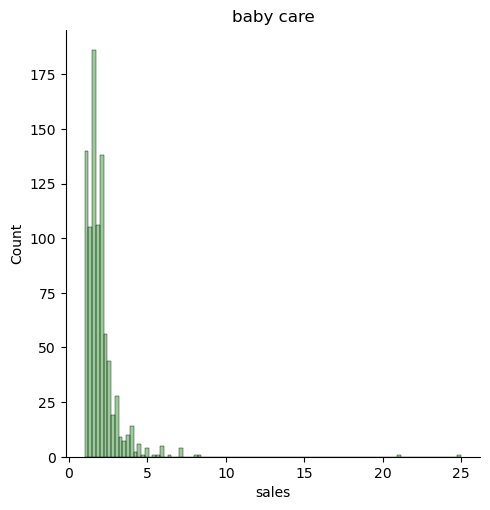

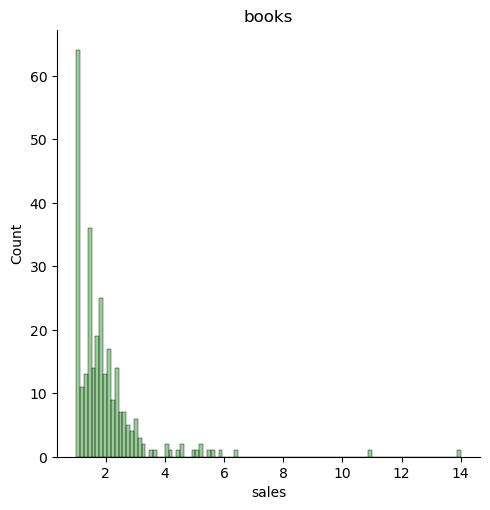

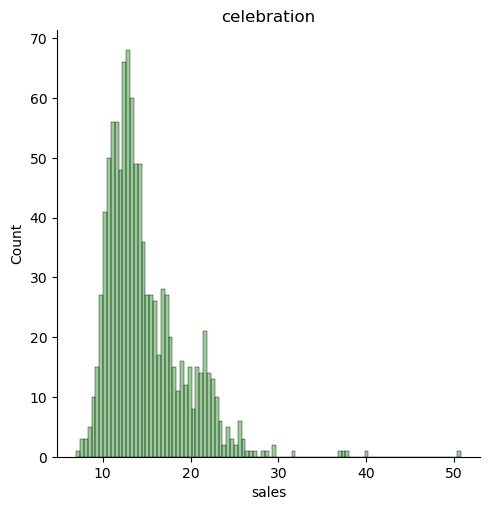

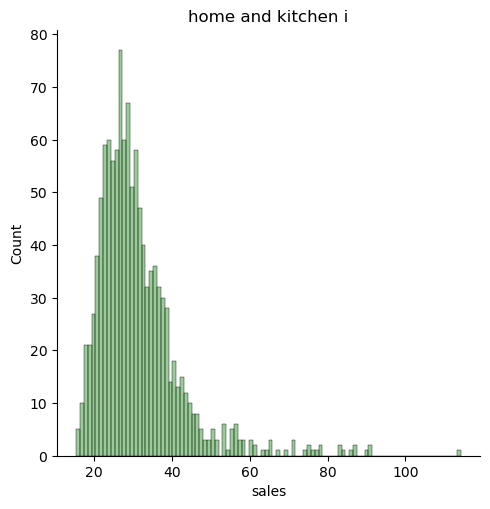

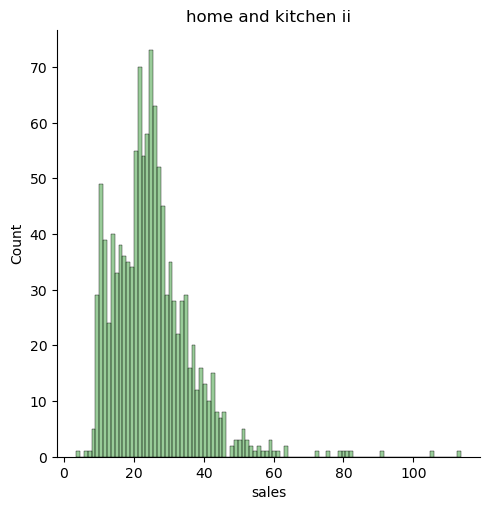

...

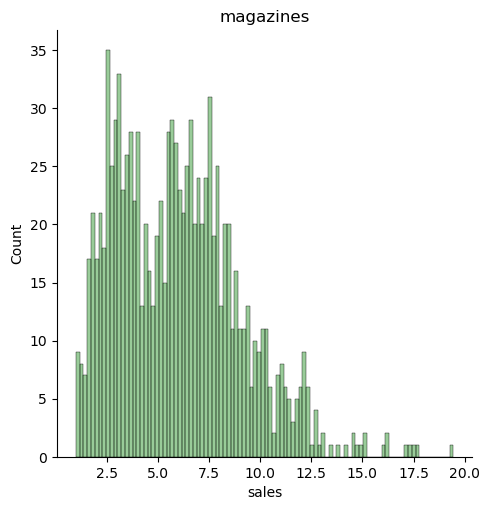

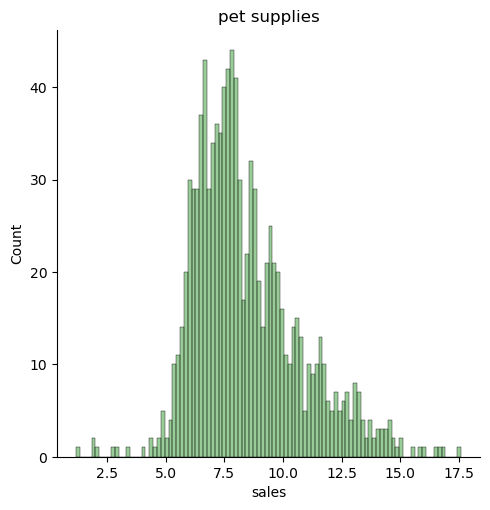

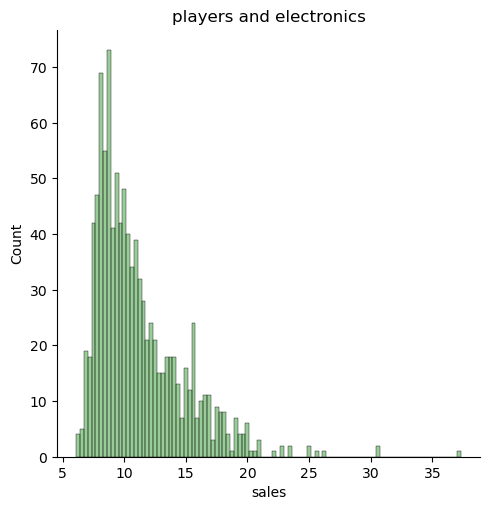

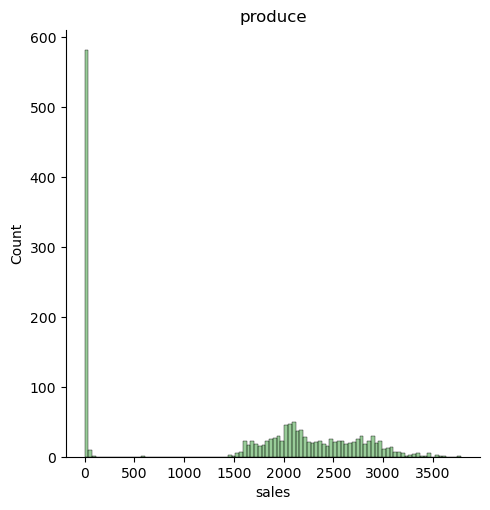

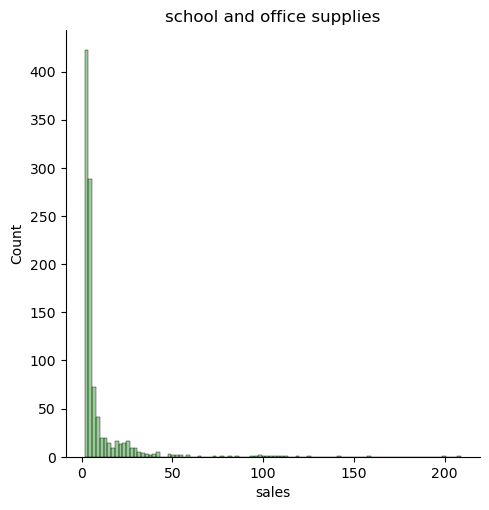

In [208]:
plt.figure(figsize=(20, 20))
for i, family in enumerate(second_type_families):
    current_value_data = second_type_families_without_zeros[second_type_families_without_zeros['family'] == family].groupby('date')['sales'].mean()
    sns.displot(current_value_data, color='g', bins=100, alpha=0.4)
    plt.title(family)

<i><b>After excluding 'sales' equal to zero from second-type families, we can see that such categories are also distributed normally.</b></i>

In [209]:
for family in family_values:
    current_family_data = train_data[train_data['family'] == family][['onpromotion', 'sales']]
    print('\033[91m' + family + '\033[0m')
    print(current_family_data.corr())
    print()

automotive
             onpromotion     sales
onpromotion     1.000000  0.209826
sales           0.209826  1.000000

baby care
             onpromotion     sales
onpromotion     1.000000  0.054954
sales           0.054954  1.000000

beauty
             onpromotion     sales
onpromotion     1.000000  0.342411
sales           0.342411  1.000000

beverages
             onpromotion     sales
onpromotion     1.000000  0.372682
sales           0.372682  1.000000

books
             onpromotion  sales
onpromotion          NaN    NaN
sales                NaN    1.0

bread/bakery
             onpromotion    sales
onpromotion      1.00000  0.13301
sales            0.13301  1.00000

celebration
             onpromotion     sales
onpromotion     1.000000  0.113292
sales           0.113292  1.000000

cleaning
             onpromotion     sales
onpromotion     1.000000  0.195184
sales           0.195184  1.000000

dairy
             onpromotion    sales
onpromotion      1.00000  0.10925
sales       

<i><b>Correlation between 'onpromotion' feature and the target depence on the 'family' feature.</b> Promotions related to such  categories as 'school and office supplies', 'produce', 'home care', 'home and kitchen', 'beauty' and 'beverages' have a good impact on the target (the bigger the promotion, the more sales).</i>

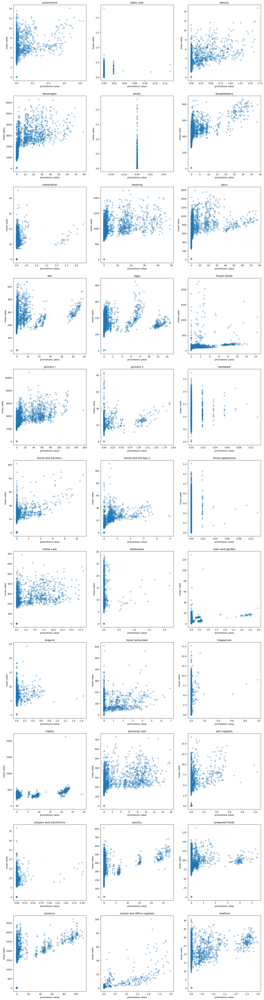

In [210]:
plt.figure(figsize=(20, 80))
for i, family in enumerate(family_values):
    plt.subplot(len(family_values) // 3, 3, i + 1)
    current_value_data = train_data[train_data['family'] == family].groupby('date')[['onpromotion', 'sales']].mean()
    plt.xlabel('promotions value')
    plt.ylabel('mean sales')
    plt.scatter(x='onpromotion', y='sales', data=current_value_data, alpha=0.3)
    plt.title(family)

<i>There is no other relationship between these features, except for linear.</i>

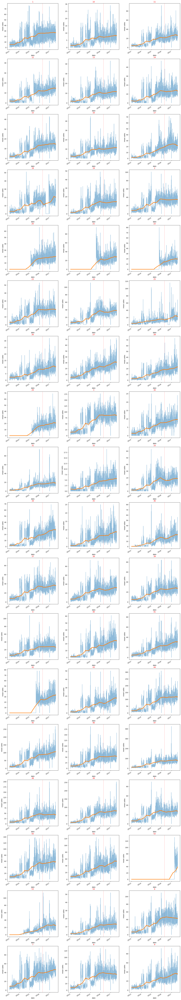

In [211]:
plt.figure(figsize=(20, 130))
for i, current_store_nbr in enumerate(train_data['store_nbr'].unique()):
    plt.subplot(len(train_data['store_nbr'].unique()) // 3, 3, i + 1)
    average_sales = train_data[train_data['store_nbr'] == current_store_nbr].groupby('date')['sales'].median()
    trend = average_sales.rolling(window=365, center=True, min_periods=183).mean()
    plt.ylabel('mean sales')
    plt.axvline(pd.to_datetime('2016-04-16'), color='r', linestyle='--', lw=0.5)
    ax = average_sales.plot(alpha=0.5)
    ax = trend.plot(ax=ax, linewidth=3)
    plt.title(current_store_nbr, color='red')

In [213]:
train_data_copy = train_data.copy()

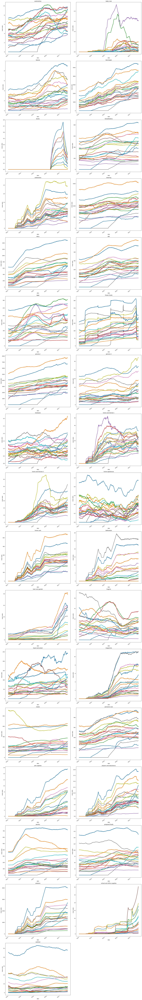

In [216]:
plt.figure(figsize=(20, 140))
for i, family in enumerate(family_values):
    ax = plt.subplot(17, 2, i + 1)
    for city in train_data_copy['store_city'].unique():
        average_sales = train_data_copy[(train_data_copy['family'] == family) & 
                                        (train_data_copy['store_city'] == city)].groupby('date')['sales'].mean()
        trend = average_sales.rolling(window=365, center=True, min_periods=183).mean()
        trend.plot(ax=ax, linewidth=3, label=city)
        plt.ylabel('mean sales')
    plt.title(family)
plt.tight_layout()

<AxesSubplot: xlabel='store_type', ylabel='count'>

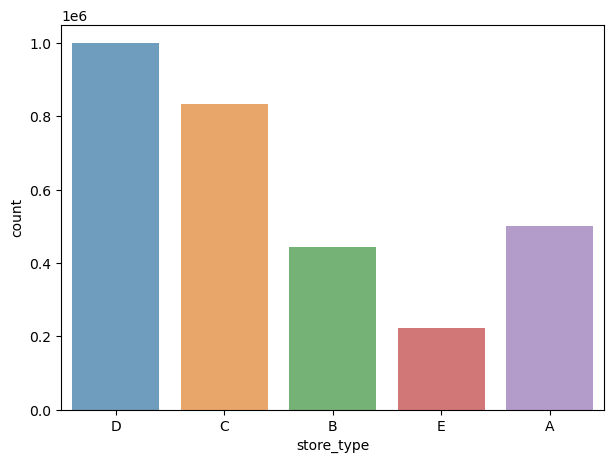

In [217]:
plt.figure(figsize=(7, 5))
sns.countplot(x=train_data['store_type'], alpha=0.7, data=train_data)

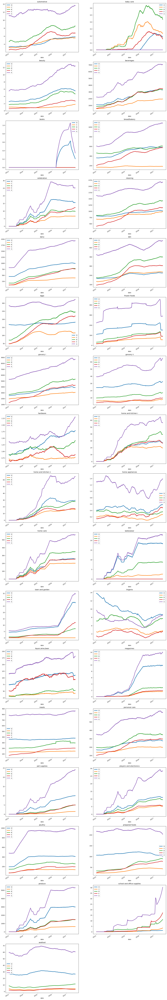

In [218]:
plt.figure(figsize=(20, 140))
for i, family in enumerate(family_values):
    ax = plt.subplot(17, 2, i + 1)
    for store_type in train_data_copy['store_type'].unique():
        average_sales = train_data_copy[(train_data_copy['family'] == family) &
                                        (train_data_copy['store_type'] == store_type)].groupby('date')['sales'].mean()
        trend = average_sales.rolling(window=365, center=True, min_periods=183).mean()
        trend.plot(ax=ax, linewidth=3, label=store_type)
        handles, labels = ax.get_legend_handles_labels()
        plt.ylabel = 'mean sales'
        plt.legend(handles, labels, loc='lower center')
    plt.title(family)
    plt.legend(train_data_copy['store_type'].unique())

<i>As we can see, there are common trends in different categories, but mean sales values are more or less depending on the type of store. Despite the fact that type A stores are not the majority, the average number of sales in it is higher than in the others.</i>

In [ ]:
train_data.to_csv('./data/kaggle/store-sales-time-series-forecasting/prepared_train.csv', index=False)